In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set() # set the default Seaborn style for graphics

!pip install --upgrade category_encoders
# Encoding
import category_encoders as ce

# Upscaling
from sklearn.utils import resample

# Machine learning
from sklearn.model_selection import train_test_split as split
from sklearn.model_selection import KFold,StratifiedKFold
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [2]:
# Getting Datasets
merged_df = pd.read_csv("ml_dataset.csv")

## Machine Learning

In this section, we will be preparing the datasets for machine learning by firstly encoding the categorical variables using target encoder. This ensures that the categorical variables are transformed into numerical representation to be used by the machine learning algorithms. In addition, we also did upscaling to balance our dataset in order to achieve better accuracy. 

For machine learning, we have used two models: Decision Tree and Random Forest coupled with GridSearchCV. There are two versions for the Decision Tree, version 1 using the dataset without upscaling and version 2 which uses the dataset with upscaling. Similarly, for Random Forest there are also 2 versions. Random Forest was performed a third time after the use of GridSearchCV for optimal performance.

### Encoding

In [3]:
# Use target encoder to encode the non-numerical columns
# Define the target encoder with smoothing to avoid overfitting
encoder = ce.TargetEncoder(cols=["NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE", "OCCUPATION_TYPE","CODE_GENDER"], smoothing=0.2)
print("Converted non-numerical columns to numerical columns using target encoder with smoothing")

# Fit and transform the encoder on the data
merged_df = encoder.fit_transform(merged_df, merged_df["STATUS"])

# Show number of numerical and non-numerical columns in the dataframe
print("\n[POST CONVERSION]\n Number of numerical columns: {}".format(merged_df.select_dtypes(include=np.number).shape[1]))
print("\n[POST CONVERSION]\n Number of non-numerical columns: {}".format(merged_df.select_dtypes(exclude=np.number).shape[1]))

Converted non-numerical columns to numerical columns using target encoder with smoothing

[POST CONVERSION]
 Number of numerical columns: 14

[POST CONVERSION]
 Number of non-numerical columns: 1


In [4]:
# Show the number of unique values in each column
print("[UNIQUE VALUES PER COLUMN]\n")
merged_df.nunique()

[UNIQUE VALUES PER COLUMN]



Unnamed: 0.1           36457
Unnamed: 0             36457
ID                     36457
STATUS                     2
CODE_GENDER                2
CNT_CHILDREN               9
AMT_INCOME_TOTAL         265
NAME_INCOME_TYPE           5
NAME_EDUCATION_TYPE        5
NAME_FAMILY_STATUS         5
NAME_HOUSING_TYPE          6
DAYS_EMPLOYED              2
OCCUPATION_TYPE           19
CNT_FAM_MEMBERS           10
Income Range               6
dtype: int64

### Upscaling

In [5]:
# Upsample Bad to match Good
creditBad = merged_df[merged_df.STATUS == 1]
creditGood = merged_df[merged_df.STATUS == 0]
 
# Upsample the good samples
creditgood_up = resample(creditGood, 
                        replace=True,                     # sample with replacement
                        n_samples=creditBad.shape[0])    # to match number of Good
 
# Combine the two classes back after upsampling
scaled_df = pd.concat([creditBad, creditgood_up])
 
# Check the ratio of the classes
scaled_df['STATUS'].value_counts()

1.0    32002
0.0    32002
Name: STATUS, dtype: int64

### Decision Tree

#### Version 1: Without Upscaling

In [6]:
store = ['AMT_INCOME_TOTAL','CNT_FAM_MEMBERS','NAME_EDUCATION_TYPE','OCCUPATION_TYPE']
X = pd.DataFrame(merged_df[store]) 
y = pd.DataFrame(merged_df['STATUS']) 

kfold = StratifiedKFold(n_splits=8, shuffle=True, random_state=0)

X_train, X_test, y_train, y_test = split(X, y, test_size=0.3)

dectree = DecisionTreeClassifier(max_depth=8,splitter='best',random_state=42)
dectree.fit(X_train, y_train)

# Plot the trained Decision Tree
f = plt.figure(figsize=(100, 20), dpi=300)
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train.columns, 
          class_names=["Bad","Good"])
plt.show()

In [8]:
y_pred = dectree.predict(X_test)
y_pred_train= dectree.predict(X_train)

Train Data
Accuracy  :	 0.8798542262627846

TPR Train :	 0.9982157990989785
TNR Train :	 0.023870967741935485

FPR Train :	 0.9761290322580645
FNR Train :	 0.001784200901021455


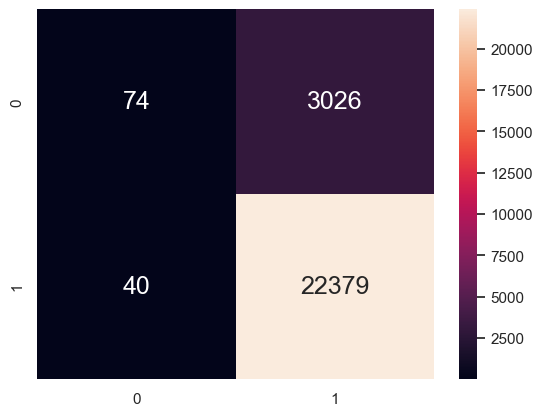

              precision    recall  f1-score   support

         0.0       0.65      0.02      0.05      3100
         1.0       0.88      1.00      0.94     22419

    accuracy                           0.88     25519
   macro avg       0.77      0.51      0.49     25519
weighted avg       0.85      0.88      0.83     25519



In [9]:
# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", dectree.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train,y_pred_train)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_pred_train), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y_train, y_pred_train))

Test Data
Accuracy  :	 0.8761199488023405

TPR Test :	 0.9982260252530523
TNR Test :	 0.012546125461254613

FPR Test :	 0.9874538745387453
FNR Test :	 0.0017739747469477198


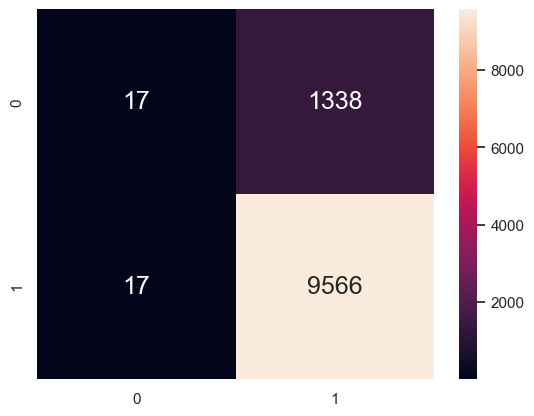

              precision    recall  f1-score   support

         0.0       0.50      0.01      0.02      1355
         1.0       0.88      1.00      0.93      9583

    accuracy                           0.88     10938
   macro avg       0.69      0.51      0.48     10938
weighted avg       0.83      0.88      0.82     10938



In [10]:
# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", dectree.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTest = confusion_matrix(y_test,y_pred)
tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()

print("FPR Test :\t", (fpTest/(tnTest + fpTest)))
print("FNR Test :\t", (fnTest/(tpTest + fnTest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y_test, y_pred))

#### Version 2: With Upscaling

In [11]:
# Extract Response and Predictors
store = ['AMT_INCOME_TOTAL','CNT_FAM_MEMBERS','NAME_EDUCATION_TYPE','OCCUPATION_TYPE']
X1 = pd.DataFrame(scaled_df[store]) 
y1 = pd.DataFrame(scaled_df['STATUS']) 

# Split the Dataset into Train and Test
X1_train, X1_test, y1_train, y1_test = split(X1, y1, test_size = 0.3)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 8)  # change max_depth to experiment
dectree.fit(X1_train, y1_train)                    # train the decision tree model

# Plot the trained Decision Tree
f = plt.figure(figsize=(100, 20), dpi=300)
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X1_train.columns, 
          class_names=["Bad","Good"])
plt.show()

Train Data
Accuracy  :	 0.5742377572429802

TPR Train :	 0.6626211434160221
TNR Train :	 0.48511744665590817

FPR Train :	 0.5148825533440918
FNR Train :	 0.3373788565839779


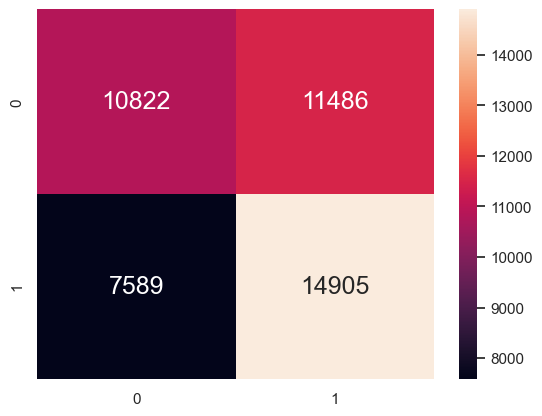

              precision    recall  f1-score   support

         0.0       0.59      0.49      0.53     22308
         1.0       0.56      0.66      0.61     22494

    accuracy                           0.57     44802
   macro avg       0.58      0.57      0.57     44802
weighted avg       0.58      0.57      0.57     44802



In [12]:
# Predict the Response corresponding to Predictors
y1_train_pred = dectree.predict(X1_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", dectree.score(X1_train, y1_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y1_train, y1_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_train, y1_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y1_train, y1_train_pred))

Test Data
Accuracy  :	 0.5591084262056036

TPR Test :	 0.6501893142616744
TNR Test :	 0.4697751186300805

FPR Test :	 0.5302248813699195
FNR Test :	 0.34981068573832563


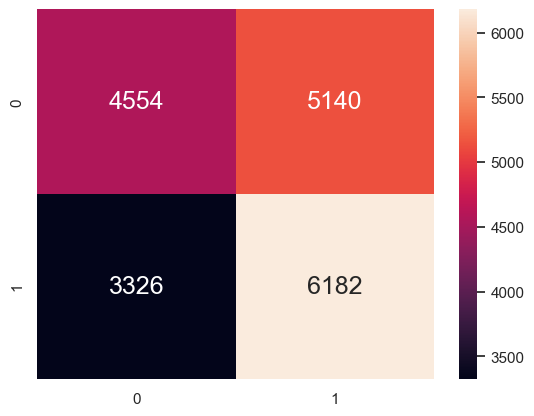

              precision    recall  f1-score   support

         0.0       0.58      0.47      0.52      9694
         1.0       0.55      0.65      0.59      9508

    accuracy                           0.56     19202
   macro avg       0.56      0.56      0.56     19202
weighted avg       0.56      0.56      0.56     19202



In [13]:
# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", dectree.score(X1_test, y1_test))
print()

# Predict the Response corresponding to Predictors
y1_pred = dectree.predict(X1_test)

# Print the Accuracy Measures from the Confusion Matrix
cmTest = confusion_matrix(y1_test,y1_pred)
tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Test :\t", (tpTest/(tpTest + fnTest)))
print("TNR Test :\t", (tnTest/(tnTest + fpTest)))
print()

print("FPR Test :\t", (fpTest/(tnTest + fpTest)))
print("FNR Test :\t", (fnTest/(tpTest + fnTest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_test, y1_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y1_test, y1_pred))

### Random Forest

#### Version 1: Without Upscaling

In [14]:
# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = None)       # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.STATUS.ravel())

RandomForestClassifier()

Train Data
Accuracy  :	 0.8887495591520044

TPR Train :	 0.9922833311030822
TNR Train :	 0.14

FPR Train :	 0.86
FNR Train :	 0.007716668896917793


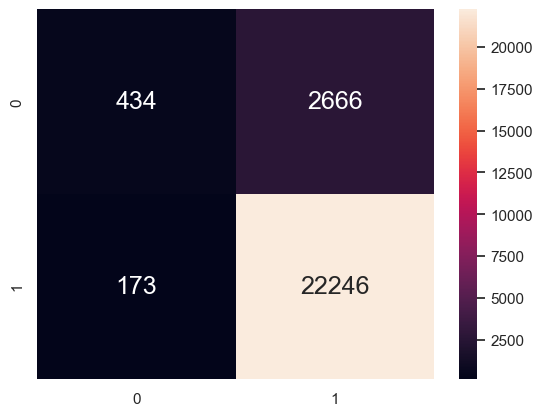

              precision    recall  f1-score   support

         0.0       0.71      0.14      0.23      3100
         1.0       0.89      0.99      0.94     22419

    accuracy                           0.89     25519
   macro avg       0.80      0.57      0.59     25519
weighted avg       0.87      0.89      0.85     25519



In [15]:
# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y_train, y_train_pred))

Test Data
Accuracy  :	 0.8746571585298958

TPR test :	 0.9871446488294314
TNR test :	 0.08905109489051095

FPR test :	 0.910948905109489
FNR test :	 0.012855351170568562


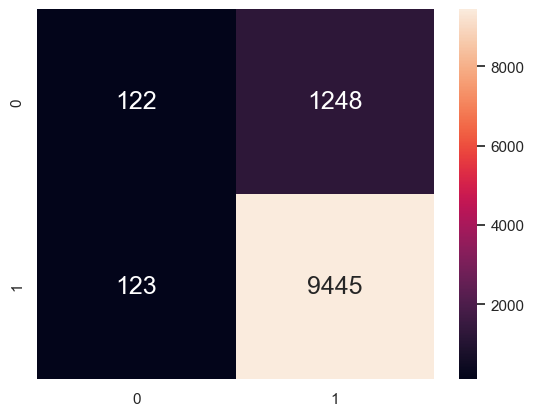

              precision    recall  f1-score   support

         0.0       0.50      0.09      0.15      1370
         1.0       0.88      0.99      0.93      9568

    accuracy                           0.87     10938
   macro avg       0.69      0.54      0.54     10938
weighted avg       0.84      0.87      0.83     10938



In [25]:
# Predict the Response corresponding to Predictors
y_pred = rforest.predict(X_test)

# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", rforest.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmtest = confusion_matrix(y_test, y_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR test :\t", (tptest/(tptest + fntest)))
print("TNR test :\t", (tntest/(tntest + fptest)))
print()

print("FPR test :\t", (fptest/(tntest + fptest)))
print("FNR test :\t", (fntest/(tptest + fntest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y_test, y_pred))

#### Version 2: With Upscaling

In [17]:
# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = None)       # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X1_train, y1_train.STATUS.ravel())

RandomForestClassifier()

Train Data
Accuracy  :	 0.712512834248471

TPR Train :	 0.6706677336178537
TNR Train :	 0.7547068316299086

FPR Train :	 0.24529316837009144
FNR Train :	 0.32933226638214635


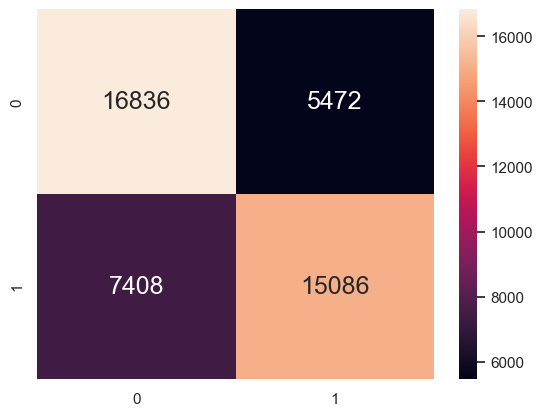

              precision    recall  f1-score   support

         0.0       0.69      0.75      0.72     22308
         1.0       0.73      0.67      0.70     22494

    accuracy                           0.71     44802
   macro avg       0.71      0.71      0.71     44802
weighted avg       0.71      0.71      0.71     44802



In [18]:
# Predict the Response corresponding to Predictors
y1_train_pred = rforest.predict(X1_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X1_train, y1_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y1_train, y1_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_train, y1_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y1_train, y1_train_pred))

Test Data
Accuracy  :	 0.6932090407249245

TPR test :	 0.6491375683634834
TNR test :	 0.7364349081906334

FPR test :	 0.2635650918093666
FNR test :	 0.3508624316365166


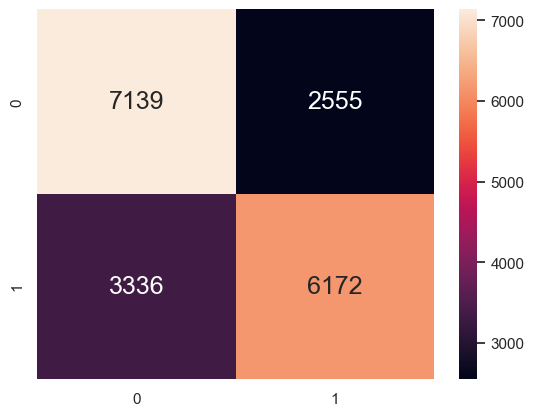

              precision    recall  f1-score   support

         0.0       0.68      0.74      0.71      9694
         1.0       0.71      0.65      0.68      9508

    accuracy                           0.69     19202
   macro avg       0.69      0.69      0.69     19202
weighted avg       0.69      0.69      0.69     19202



In [19]:
# Predict the Response corresponding to Predictors
y1_pred = rforest.predict(X1_test)

# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", rforest.score(X1_test, y1_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmtest = confusion_matrix(y1_test, y1_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR test :\t", (tptest/(tptest + fntest)))
print("TNR test :\t", (tntest/(tntest + fptest)))
print()

print("FPR test :\t", (fptest/(tntest + fptest)))
print("FNR test :\t", (fntest/(tptest + fntest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y1_test, y1_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y1_test, y1_pred))

### GridSearchCV

In [20]:
# Define the Hyper-parameter Grid to search on, in case of Random Forest
param_grid = {'n_estimators': np.arange(100,501,100)}   # number of trees  

# Create the Hyper-parameter Grid
hpGrid = GridSearchCV(RandomForestClassifier(),   # the model family
                      param_grid,                 # the search grid
                      cv = 5,                     # 5-fold cross-validation
                      scoring = 'balanced_accuracy')       # score to evaluate

# Train the models using Cross-Validation
hpGrid.fit(X_train, y_train.STATUS.ravel())

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': array([100, 200, 300, 400, 500])},
             scoring='balanced_accuracy')

In [21]:
# Fetch the best Model or the best set of Hyper-parameters
print(hpGrid.best_estimator_)

RandomForestClassifier()


In [22]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = split(X, y, test_size = 0.3)

# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 500,   # found using GridSearchCV
                                 max_depth = None)       # found using GridSearchCV

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.STATUS.ravel())

RandomForestClassifier(n_estimators=500)

Train Data
Accuracy  :	 0.89016027273796

TPR Train :	 0.9926896674690202
TNR Train :	 0.14457050243111833

FPR Train :	 0.8554294975688816
FNR Train :	 0.007310332530979763


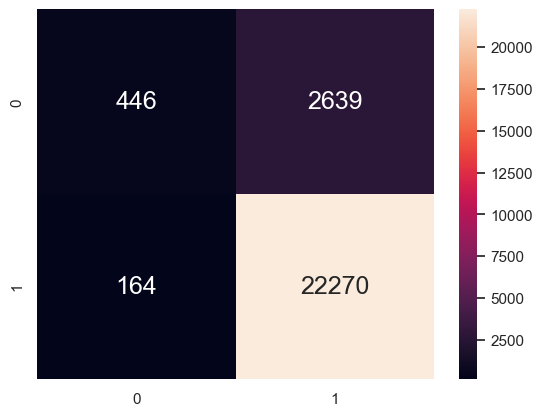

              precision    recall  f1-score   support

         0.0       0.73      0.14      0.24      3085
         1.0       0.89      0.99      0.94     22434

    accuracy                           0.89     25519
   macro avg       0.81      0.57      0.59     25519
weighted avg       0.87      0.89      0.86     25519



In [23]:
# Predict the Response corresponding to Predictors
y_train_pred = rforest.predict(X_train)

# Print the Classification Accuracy
print("Train Data")
print("Accuracy  :\t", rforest.score(X_train, y_train))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmTrain = confusion_matrix(y_train, y_train_pred)
tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR Train :\t", (tpTrain/(tpTrain + fnTrain)))
print("TNR Train :\t", (tnTrain/(tnTrain + fpTrain)))
print()

print("FPR Train :\t", (fpTrain/(tnTrain + fpTrain)))
print("FNR Train :\t", (fnTrain/(tpTrain + fnTrain)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_train, y_train_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for train data and predictions
print(classification_report(y_train, y_train_pred))

Test Data
Accuracy  :	 0.8746571585298958

TPR test :	 0.6491375683634834
TNR test :	 0.7364349081906334

FPR test :	 0.2635650918093666
FNR test :	 0.3508624316365166


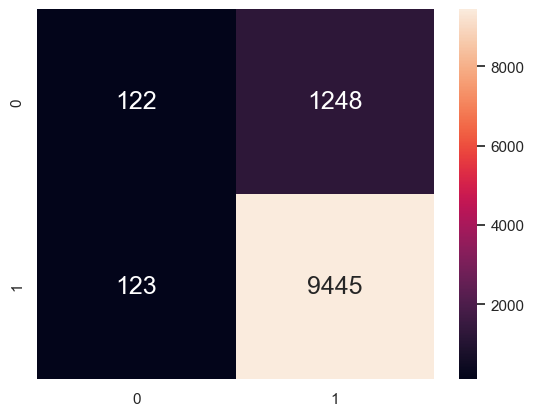

              precision    recall  f1-score   support

         0.0       0.68      0.74      0.71      9694
         1.0       0.71      0.65      0.68      9508

    accuracy                           0.69     19202
   macro avg       0.69      0.69      0.69     19202
weighted avg       0.69      0.69      0.69     19202



In [24]:
# Predict the Response corresponding to Predictors
y_pred = rforest.predict(X_test)

# Print the Classification Accuracy
print("Test Data")
print("Accuracy  :\t", rforest.score(X_test, y_test))
print()

# Print the Accuracy Measures from the Confusion Matrix
cmtest = confusion_matrix(y1_test, y1_pred)
tptest = cmtest[1][1] # True Positives : Good (1) predicted Good (1)
fptest = cmtest[0][1] # False Positives : Bad (0) predicted Good (1)
tntest = cmtest[0][0] # True Negatives : Bad (0) predicted Bad (0)
fntest = cmtest[1][0] # False Negatives : Good (1) predicted Bad (0)

print("TPR test :\t", (tptest/(tptest + fntest)))
print("TNR test :\t", (tntest/(tntest + fptest)))
print()

print("FPR test :\t", (fptest/(tntest + fptest)))
print("FNR test :\t", (fntest/(tptest + fntest)))

# Plot the two-way Confusion Matrix
sb.heatmap(confusion_matrix(y_test, y_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18})
plt.show()

# View the classification report for test data and predictions
print(classification_report(y1_test, y1_pred))

### In Conclusion

Overall, through this process we have come to the conclusion that Total Income is the variable that affects a person's ability to pay off loans the most. 

From the outputs, we could see how upscaling improved the performance of both the Decision Tree and the Random Forest, as well as how Random Forest is more accurate than Decision Tree. We could also see how coupling Random Forest with GridSearchCV lead to its optimal performance, with the accuracy increasing to 87% from the initial 68%.